In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import roc_auc_score
from sklearn.decomposition import PCA

# 중요도 판별
import eli5 
from eli5.sklearn import PermutationImportance 
from xgboost import XGBClassifier
from xgboost import plot_importance

# PyTorch 관련 import
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows: 맑은 고딕
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

In [15]:
train_val = pd.read_csv("train.csv")
display(train_val.head())

,Mass_Pilot,Width,Aspect,Inch,Plant,Proc_Param1,Proc_Param2,Proc_Param3,Proc_Param4,Proc_Param5,...,p247,p248,p249,p250,p251,p252,p253,p254,p255,Class
0,False,245,40,19,Plant_6,465.00,631.85,1460.8,1985,2059,...,1.475031,1.473817,1.472950,1.474981,1.477011,1.479157,1.483289,1.487421,1.491552,Good
1,False,275,40,21,Plant_2,516.01,701.87,1621.1,2205,2291,...,1.320114,1.326607,1.333636,1.340665,1.347694,1.352602,1.355859,1.359115,1.362371,Good
2,False,225,45,17,Plant_7,416.99,583.14,1310.0,1832,1918,...,1.344303,1.346259,1.348215,1.350183,1.352166,1.354149,1.356112,1.358066,1.360021,Good
3,True,275,30,20,Plant_7,490.01,623.89,1539.4,1960,2040,...,1.389538,1.389953,1.393673,1.397393,1.401113,1.405803,1.411120,1.416437,1.421754,Good
4,True,265,45,21,Plant_2,516.01,714.61,1621.1,2245,2336,...,1.435297,1.431648,1.428000,1.424352,1.420704,1.417607,1.415256,1.412904,1.410553,Good


In [16]:
train_val_X = train_val.drop(columns=['Class'])
train_val_y = train_val['Class'].apply(lambda x: 1 if x == 'NG' else 0)

display(train_val_X.head())
display(train_val_y.head())

,Mass_Pilot,Width,Aspect,Inch,Plant,Proc_Param1,Proc_Param2,Proc_Param3,Proc_Param4,Proc_Param5,...,p246,p247,p248,p249,p250,p251,p252,p253,p254,p255
0,False,245,40,19,Plant_6,465.00,631.85,1460.8,1985,2059,...,1.476245,1.475031,1.473817,1.472950,1.474981,1.477011,1.479157,1.483289,1.487421,1.491552
1,False,275,40,21,Plant_2,516.01,701.87,1621.1,2205,2291,...,1.313735,1.320114,1.326607,1.333636,1.340665,1.347694,1.352602,1.355859,1.359115,1.362371
2,False,225,45,17,Plant_7,416.99,583.14,1310.0,1832,1918,...,1.344270,1.344303,1.346259,1.348215,1.350183,1.352166,1.354149,1.356112,1.358066,1.360021
3,True,275,30,20,Plant_7,490.01,623.89,1539.4,1960,2040,...,1.389773,1.389538,1.389953,1.393673,1.397393,1.401113,1.405803,1.411120,1.416437,1.421754
4,True,265,45,21,Plant_2,516.01,714.61,1621.1,2245,2336,...,1.438945,1.435297,1.431648,1.428000,1.424352,1.420704,1.417607,1.415256,1.412904,1.410553


0    0
1    0
2    0
3    0
4    0
Name: Class, dtype: int64

In [5]:
from sklearn.model_selection import train_test_split
# 오버 샘플링을 위한 라이브러리
from imblearn.over_sampling import SMOTENC

In [6]:
cat_list = train_val_X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
num_list = sorted(list(set(train_val_X.columns) - set(cat_list)))

print(cat_list)

['Mass_Pilot', 'Plant', 'Proc_Param6']


SMOTE-NC

In [7]:
# SMOTE-NC 오버 샘플링 적용

smote_nc = SMOTENC(categorical_features=cat_list, random_state=42)
train_val_X_resampled, train_val_y_resampled = smote_nc.fit_resample(train_val_X, train_val_y)
train_val_resampled = pd.concat([train_val_X_resampled, train_val_y_resampled], axis=1)

print("y unique:", np.unique(train_val_y_resampled))
print("y shape:", train_val_y_resampled.shape)
print("Target 비율:", train_val_y_resampled.value_counts(normalize=True))
print("x shape:", train_val_X_resampled.shape)
print(train_val_resampled.head())

y unique: [0 1]
y shape: (1226,)
Target 비율: Class
0    0.5
1    0.5
Name: proportion, dtype: float64
x shape: (1226, 798)
   Mass_Pilot  Width  Aspect  Inch    Plant  Proc_Param1  Proc_Param2  \
0       False    245      40    19  Plant_6       465.00       631.85   
1       False    275      40    21  Plant_2       516.01       701.87   
2       False    225      45    17  Plant_7       416.99       583.14   
3        True    275      30    20  Plant_7       490.01       623.89   
4        True    265      45    21  Plant_2       516.01       714.61   

   Proc_Param3  Proc_Param4  Proc_Param5  ...      p247      p248      p249  \
0       1460.8         1985         2059  ...  1.475031  1.473817  1.472950   
1       1621.1         2205         2291  ...  1.320114  1.326607  1.333636   
2       1310.0         1832         1918  ...  1.344303  1.346259  1.348215   
3       1539.4         1960         2040  ...  1.389538  1.389953  1.393673   
4       1621.1         2245         2336  ..

In [8]:
#좌표 데이터 추출
xyp_value = train_val_resampled.iloc[:, 31:]
display(xyp_value.head())

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,p247,p248,p249,p250,p251,p252,p253,p254,p255,Class
0,239.886815,240.049079,240.211344,240.373608,240.535902,240.698242,240.860582,241.022921,241.191465,241.360307,...,1.475031,1.473817,1.472950,1.474981,1.477011,1.479157,1.483289,1.487421,1.491552,0
1,265.197580,265.292190,265.386800,265.484497,265.582326,265.680142,265.777284,265.874426,265.971606,266.068888,...,1.320114,1.326607,1.333636,1.340665,1.347694,1.352602,1.355859,1.359115,1.362371,0
2,214.748164,214.838477,214.928791,215.019739,215.111856,215.203972,215.295963,215.387721,215.479478,215.571219,...,1.344303,1.346259,1.348215,1.350183,1.352166,1.354149,1.356112,1.358066,1.360021,0
3,251.893297,252.031334,252.169372,252.307409,252.445725,252.584944,252.724164,252.863383,253.002603,253.141128,...,1.389538,1.389953,1.393673,1.397393,1.401113,1.405803,1.411120,1.416437,1.421754,0
4,265.088809,265.265819,265.442828,265.621792,265.801157,265.979895,266.156357,266.332819,266.520115,266.711078,...,1.435297,1.431648,1.428000,1.424352,1.420704,1.417607,1.415256,1.412904,1.410553,0


In [9]:
xyp_list = []

for sample_idx, row in xyp_value.iterrows():
    for i in range(1,256):
        xyp_list.append({
            "sample_idx": sample_idx,
            "x": row[f"x{i}"],
            "y": row[f"y{i}"],
            "p": row[f"p{i}"],
            'Class': row['Class']
        })

xyp_df = pd.DataFrame(xyp_list)
xyp_df.head()

,sample_idx,x,y,p,Class
0,0,239.886815,101.050016,1.100941,0.0
1,0,240.049079,101.453623,1.197078,0.0
2,0,240.211344,101.857229,1.293215,0.0
3,0,240.373608,102.260835,1.389351,0.0
4,0,240.535902,102.664430,1.469165,0.0


NG 클래스 샘플 개수: 613


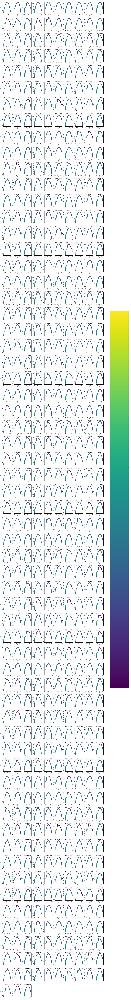

In [10]:
# NG 클래스(Class == 1)만 필터링
ng_df = xyp_df[xyp_df['Class'] == 1]
ng_sample_indices = ng_df['sample_idx'].unique()

print(f"NG 클래스 샘플 개수: {len(ng_sample_indices)}")

vmin = ng_df["p"].min()
vmax = ng_df["p"].max()

# NG 샘플 개수에 맞게 subplot 크기 조정
n_samples = len(ng_sample_indices)
n_cols = 10
n_rows = (n_samples + n_cols - 1) // n_cols  # 올림 계산

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 3*n_rows))

# axes를 1차원 배열로 변환
if n_rows == 1:
    axes = axes.reshape(1, -1)
axes_flat = axes.ravel()

for idx, sample_idx in enumerate(ng_sample_indices):
    ax = axes_flat[idx]
    sample_df = ng_df[ng_df['sample_idx'] == sample_idx]
    
    sc = ax.scatter(
        sample_df['x'], sample_df['y'],
        c=sample_df['p'],
        cmap="viridis",
        vmin=vmin,
        vmax=vmax
    )

    ax.set_title(f"NG Sample {sample_idx}")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")

# 사용하지 않는 subplot 숨기기
for idx in range(len(ng_sample_indices), len(axes_flat)):
    axes_flat[idx].axis('off')

fig.tight_layout()
fig.subplots_adjust(right=0.8)

cbar = fig.colorbar(sc, ax=axes, location="right", shrink=0.7)
cbar.set_label("p")

ADASYN

In [18]:
cat_list = train_val_X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
num_list = sorted(list(set(train_val_X.columns) - set(cat_list)))

OE = OneHotEncoder(min_frequency=0.01,handle_unknown='infrequent_if_exist',sparse_output=False)
OE.fit(train_val_X[cat_list])

train_val_X_cat = pd.DataFrame(OE.transform(train_val_X[cat_list]), columns=OE.get_feature_names_out(cat_list))
train_val_X_num = train_val_X[num_list]
train_val_X = pd.concat([train_val_X_cat, train_val_X_num], axis=1)


In [19]:
from imblearn.over_sampling import ADASYN

adasyn = ADASYN(random_state=42)

train_val_X_resampled, train_val_y_resampled = adasyn.fit_resample(train_val_X, train_val_y)

In [21]:
train_val_resampled = pd.concat([train_val_X_resampled, train_val_y_resampled], axis=1)

print("y unique:", np.unique(train_val_y_resampled))
print("y shape:", train_val_y_resampled.shape)
print("Target 비율:", train_val_y_resampled.value_counts(normalize=True))
print("x shape:", train_val_X_resampled.shape)
print(train_val_resampled.head())

y unique: [0 1]
y shape: (1227,)
Target 비율: Class
1    0.500407
0    0.499593
Name: proportion, dtype: float64
x shape: (1227, 809)
   Mass_Pilot_False  Mass_Pilot_True  Plant_Plant_1  Plant_Plant_2  \
0               1.0              0.0            0.0            0.0   
1               1.0              0.0            0.0            1.0   
2               1.0              0.0            0.0            0.0   
3               0.0              1.0            0.0            0.0   
4               0.0              1.0            0.0            1.0   

   Plant_Plant_3  Plant_Plant_4  Plant_Plant_6  Plant_Plant_7  Plant_Plant_8  \
0            0.0            0.0            1.0            0.0            0.0   
1            0.0            0.0            0.0            0.0            0.0   
2            0.0            0.0            0.0            1.0            0.0   
3            0.0            0.0            0.0            1.0            0.0   
4            0.0            0.0            0.0 

In [23]:
xyp_value = train_val_resampled.iloc[:, 31:]
display(xyp_value.head())

,X1,X2,X3,X4,X5,Y1,Y2,Y3,Y4,Y5,...,y91,y92,y93,y94,y95,y96,y97,y98,y99,Class
0,38.635,51.608,64.907,86.519,112.240,1.680,1.376,1.421,1.388,1.492,...,123.909598,124.145460,124.376234,124.605533,124.829403,125.051263,125.268717,125.483102,125.693957,0
1,47.828,63.279,79.686,98.663,121.010,1.140,1.487,1.687,1.591,1.362,...,138.950967,139.364342,139.777716,140.191090,140.604464,141.017839,141.431213,141.844587,142.257139,0
2,42.714,54.187,65.753,90.073,113.811,1.171,1.660,1.458,1.373,1.360,...,113.424995,113.805124,114.185252,114.397557,114.587151,114.481010,114.379673,114.290062,114.204491,0
3,50.184,57.432,65.243,83.531,95.943,0.670,1.011,1.280,1.458,1.422,...,131.561034,131.804288,132.046833,132.289378,132.535163,132.790912,133.046660,133.302409,133.565862,0
4,37.506,53.608,69.387,96.540,123.066,1.772,1.658,1.661,1.514,1.411,...,128.187655,128.335929,128.482171,128.625512,128.766083,128.904821,129.040476,129.173467,129.304637,0


In [24]:
xyp_list = []

for sample_idx, row in xyp_value.iterrows():
    for i in range(1,256):
        xyp_list.append({
            "sample_idx": sample_idx,
            "x": row[f"x{i}"],
            "y": row[f"y{i}"],
            "p": row[f"p{i}"],
            'Class': row['Class']
        })

xyp_df = pd.DataFrame(xyp_list)
xyp_df.head()

,sample_idx,x,y,p,Class
0,0,239.886815,101.050016,1.100941,0.0
1,0,240.049079,101.453623,1.197078,0.0
2,0,240.211344,101.857229,1.293215,0.0
3,0,240.373608,102.260835,1.389351,0.0
4,0,240.535902,102.664430,1.469165,0.0


NG 클래스 샘플 개수: 614


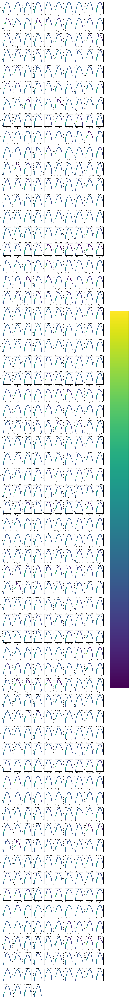

In [25]:
# NG 클래스(Class == 1)만 필터링
ng_df = xyp_df[xyp_df['Class'] == 1]
ng_sample_indices = ng_df['sample_idx'].unique()

print(f"NG 클래스 샘플 개수: {len(ng_sample_indices)}")

vmin = ng_df["p"].min()
vmax = ng_df["p"].max()

# NG 샘플 개수에 맞게 subplot 크기 조정
n_samples = len(ng_sample_indices)
n_cols = 10
n_rows = (n_samples + n_cols - 1) // n_cols  # 올림 계산

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 3*n_rows))

# axes를 1차원 배열로 변환
if n_rows == 1:
    axes = axes.reshape(1, -1)
axes_flat = axes.ravel()

for idx, sample_idx in enumerate(ng_sample_indices):
    ax = axes_flat[idx]
    sample_df = ng_df[ng_df['sample_idx'] == sample_idx]
    
    sc = ax.scatter(
        sample_df['x'], sample_df['y'],
        c=sample_df['p'],
        cmap="viridis",
        vmin=vmin,
        vmax=vmax
    )

    ax.set_title(f"NG Sample {sample_idx}")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")

# 사용하지 않는 subplot 숨기기
for idx in range(len(ng_sample_indices), len(axes_flat)):
    axes_flat[idx].axis('off')

fig.tight_layout()
fig.subplots_adjust(right=0.8)

cbar = fig.colorbar(sc, ax=axes, location="right", shrink=0.7)
cbar.set_label("p")